In [5]:
#Import libraries 
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from PIL import Image
from skimage.io import imread
from skimage.segmentation import mark_boundaries
from skimage.util import montage
from skimage.morphology import label 
'''for the memory management'''
import gc
gc.enable()

In [6]:
#Train and Test directories
train_image_dir="C:\\Users\\hp\\Desktop\\airbus-ship-detection\\train_v2"
test_image_dir="C:\\Users\\hp\\Desktop\\airbus-ship-detection\\test_v2"

In [7]:
#Getting into train directory
train_images=os.listdir(train_image_dir)
train_images.sort()
print(f'Total of {len(train_images)} image in train directory.\nthe 1st five train images looks like:{train_images[:5]}')

Total of 192556 image in train directory.
the 1st five train images looks like:['00003e153.jpg', '0001124c7.jpg', '000155de5.jpg', '000194a2d.jpg', '0001b1832.jpg']


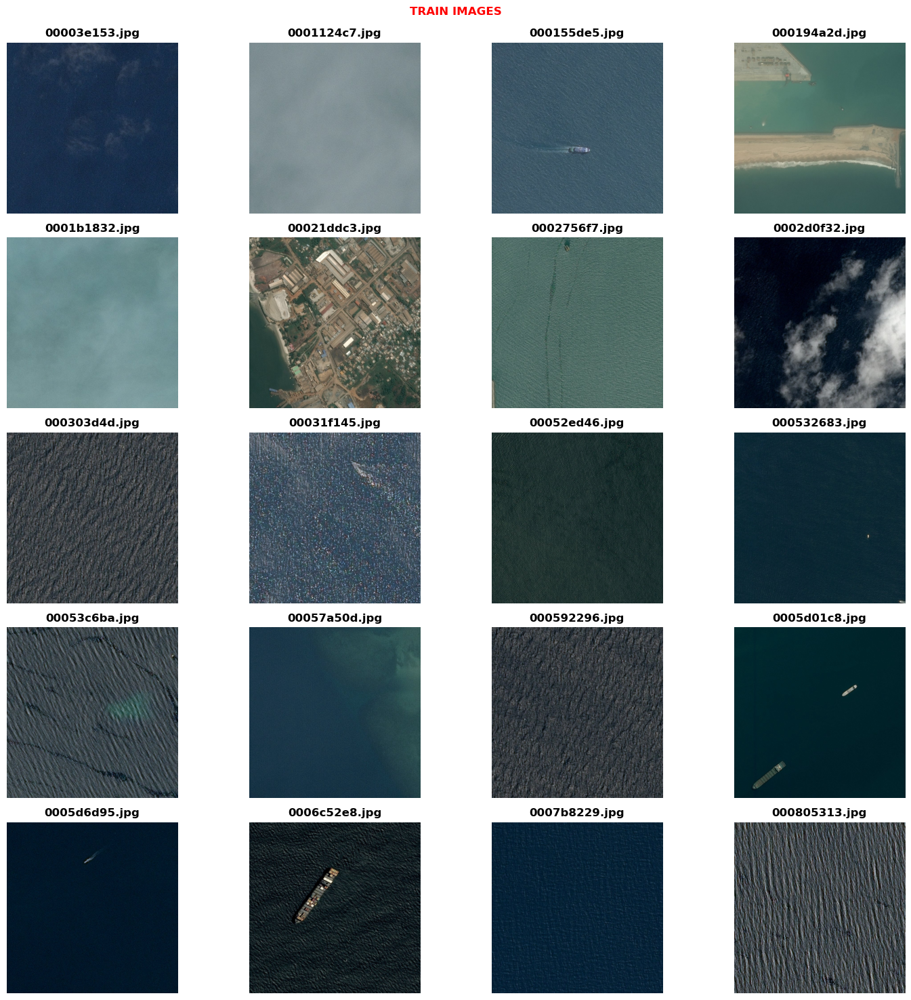

In [8]:
#Using for loop to gendrate different images to understand how data looks like
plt.figure(figsize=(15,15))
plt.suptitle('TRAIN IMAGES\n', weight = 'bold', fontsize = 12, color = 'r')
for i in range(20): 
    plt.subplot(5, 4, i+1)
    plt.imshow(imread(train_image_dir + "/" + train_images[i]))
    plt.title(f"{train_images[i]}", weight = 'bold')
    plt.axis('off')
plt.tight_layout()

In [9]:
#Train ships segmented masks
masks=pd.read_csv("C:\\Users\\hp\\Desktop\\airbus-ship-detection\\train_ship_segmentations_v2.csv")
masks.head(10)

,ImageId,EncodedPixels
0,00003e153.jpg,NaN
1,0001124c7.jpg,NaN
2,000155de5.jpg,264661 17 265429 33 266197 33 266965 33 267733...
3,000194a2d.jpg,360486 1 361252 4 362019 5 362785 8 363552 10 ...
4,000194a2d.jpg,51834 9 52602 9 53370 9 54138 9 54906 9 55674 ...
5,000194a2d.jpg,198320 10 199088 10 199856 10 200624 10 201392...
6,000194a2d.jpg,55683 1 56451 1 57219 1 57987 1 58755 1 59523 ...
7,000194a2d.jpg,254389 9 255157 17 255925 17 256693 17 257461 ...
8,0001b1832.jpg,NaN
9,00021ddc3.jpg,108287 1 109054 3 109821 4 110588 5 111356 5 1...


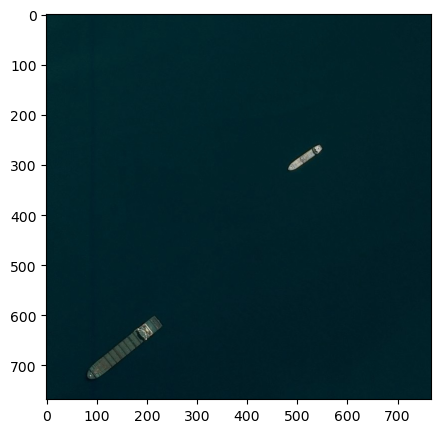

In [10]:
#Let us now see how it works for Image id: '0005d01c8.jpg' we have in the mask data frame

#Original image from training set
img_arr = imread(train_image_dir +'/'+"0005d01c8.jpg")
plt.figure(figsize=(5,5))
plt.imshow(img_arr)
plt.show()


In [11]:
#print the shape of the img
img_arr.shape

(768, 768, 3)

In [12]:
#Filter out all 0005d01c8.jpg image ids and respective encoded data
#2 ships means 2 same image ids will be there!
rle_0 = masks.query("ImageId=='0005d01c8.jpg'")['EncodedPixels']
rle_0

29    56010 1 56777 3 57544 6 58312 7 59079 9 59846 ...
30    365871 1 366638 3 367405 6 368173 7 368940 9 3...
Name: EncodedPixels, dtype: object

In [13]:
#Make a list of each mask shown above also visualise whats happening!
mask_lst , ct = [] , 1
for mask in rle_0:
    print(f'Mask {ct}: \n{mask}\n\n')
    mask_lst.append(mask)
    ct+=1

Mask 1: 
56010 1 56777 3 57544 6 58312 7 59079 9 59846 11 60613 14 61380 16 62148 17 62915 19 63682 22 64449 24 65216 26 65984 27 66751 30 67518 32 68285 34 69052 36 69820 38 70587 40 71354 42 72121 42 72888 42 73656 42 74423 42 75190 42 75957 42 76724 42 77492 42 78259 42 79026 42 79793 42 80560 42 81328 42 82095 42 82862 42 83629 42 84396 42 85164 42 85931 42 86698 42 87465 42 88232 42 89000 42 89767 42 90534 42 91301 42 92068 42 92836 42 93603 42 94370 42 95137 42 95904 42 96672 42 97439 42 98206 42 98973 42 99740 42 100508 42 101275 42 102042 42 102809 42 103576 42 104344 42 105111 42 105878 42 106645 42 107412 42 108180 42 108947 42 109714 42 110481 42 111249 41 112016 42 112783 42 113550 42 114317 42 115085 41 115852 42 116619 42 117386 42 118153 42 118921 41 119688 42 120455 42 121222 42 121989 42 122757 41 123524 42 124291 42 125058 42 125825 42 126593 42 127360 42 128127 42 128894 42 129661 42 130429 42 131196 42 131963 42 132730 42 133497 42 134265 42 135032 42 135799 42 1365

In [14]:
#Split and Display how the first mask in the list looks like
split=mask_lst[0].split()
print(split)

['56010', '1', '56777', '3', '57544', '6', '58312', '7', '59079', '9', '59846', '11', '60613', '14', '61380', '16', '62148', '17', '62915', '19', '63682', '22', '64449', '24', '65216', '26', '65984', '27', '66751', '30', '67518', '32', '68285', '34', '69052', '36', '69820', '38', '70587', '40', '71354', '42', '72121', '42', '72888', '42', '73656', '42', '74423', '42', '75190', '42', '75957', '42', '76724', '42', '77492', '42', '78259', '42', '79026', '42', '79793', '42', '80560', '42', '81328', '42', '82095', '42', '82862', '42', '83629', '42', '84396', '42', '85164', '42', '85931', '42', '86698', '42', '87465', '42', '88232', '42', '89000', '42', '89767', '42', '90534', '42', '91301', '42', '92068', '42', '92836', '42', '93603', '42', '94370', '42', '95137', '42', '95904', '42', '96672', '42', '97439', '42', '98206', '42', '98973', '42', '99740', '42', '100508', '42', '101275', '42', '102042', '42', '102809', '42', '103576', '42', '104344', '42', '105111', '42', '105878', '42', '10664

In [15]:
#Grab all the starting pixels and lenghts and convert it into integers using numpy
starts, lengths=[np.array(x,dtype=int) for x in (split[::2],split[1::2])]
starts, lengths

(array([ 56010,  56777,  57544,  58312,  59079,  59846,  60613,  61380,
         62148,  62915,  63682,  64449,  65216,  65984,  66751,  67518,
         68285,  69052,  69820,  70587,  71354,  72121,  72888,  73656,
         74423,  75190,  75957,  76724,  77492,  78259,  79026,  79793,
         80560,  81328,  82095,  82862,  83629,  84396,  85164,  85931,
         86698,  87465,  88232,  89000,  89767,  90534,  91301,  92068,
         92836,  93603,  94370,  95137,  95904,  96672,  97439,  98206,
         98973,  99740, 100508, 101275, 102042, 102809, 103576, 104344,
        105111, 105878, 106645, 107412, 108180, 108947, 109714, 110481,
        111249, 112016, 112783, 113550, 114317, 115085, 115852, 116619,
        117386, 118153, 118921, 119688, 120455, 121222, 121989, 122757,
        123524, 124291, 125058, 125825, 126593, 127360, 128127, 128894,
        129661, 130429, 131196, 131963, 132730, 133497, 134265, 135032,
        135799, 136566, 137333, 138101, 138868, 139635, 140402, 

In [16]:
# Get the ending pixels.
'''Examples :
56010  1 ---> Starts at 56010 and ends at 56010
56777  3 ---> Starts at 56777 and ends at 56779
57544  6 ---> Starts at 57544 and ends at 57549'''
ends =starts + lengths-1
pd.DataFrame({
    'Starts' : starts,
    'Lengths' : lengths,
    'Ends' : ends
}).head(10)

,Starts,Lengths,Ends
0,56010,1,56010
1,56777,3,56779
2,57544,6,57549
3,58312,7,58318
4,59079,9,59087
5,59846,11,59856
6,60613,14,60626
7,61380,16,61395
8,62148,17,62164
9,62915,19,62933


In [17]:
#Create 1s in place of these pixels and rest should be 0
img = np.zeros(768*768, dtype = np.uint8)
for start, end in zip(starts, ends):
    img[start:end+1]=1

In [18]:
#Check how output looks
img[56776:56781] # Should output 0, 1, 1, 1 ,0 as we know 56777, 56778, 56779 ---> 1 and 5676, 56780 ---> 0

array([0, 1, 1, 1, 0], dtype=uint8)

In [19]:
#Do the same idea for another ship in the image
split_1 = mask_lst[1].split()                                                            #Split the mask into start_pixels and lengths
starts,lengths=[np.array(x,dtype = int) for x in (split_1[::2],split_1[1::2])]   #Generate arrays from only starts and lengths
ends = starts + lengths-1                                                                #Start pixel to end pixel will be start - 1 + length
img1 = np.zeros(768*768, dtype = np.uint8)                                               #1D array containing all zeros
for start, end in zip(starts, ends):                                                     #For each start to end pair
    img1[start:end+1]=1                                                                  #Convert the values from 0 to 1

In [20]:
#Reshaping both the ship masks and combining it to form the final mask!
img = img.reshape(768, 768)
img1 = img1.reshape(768, 768)
final = img+img1
print(final, '\n\n', final.shape, '\n\n' , final.ndim)

[[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]] 

 (768, 768) 

 2


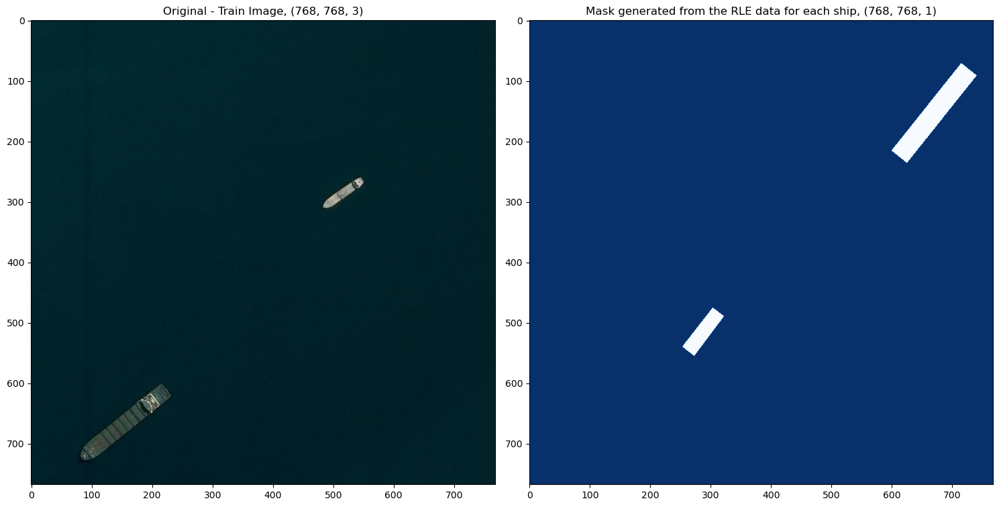

In [21]:
# Expand dimension of this array to have only 1 channel in the mask and visualise original and final mask
final = np.expand_dims(final,-1) #-1 means the last available dimenstion,in this case it is 2.Hence,on axis=2 we will get 1.
original = imread(train_image_dir+'/'+train_images[15])
plt.figure(figsize=(15, 8))
plt.subplot(1, 2, 1)
plt.title(f"Original - Train Image, {original.shape}")
plt.imshow(original)
plt.subplot(1, 2, 2)
plt.title(f"Mask generated from the RLE data for each ship, {final.shape}")
plt.imshow(final, cmap = "Blues_r")
plt.tight_layout()
plt.show()

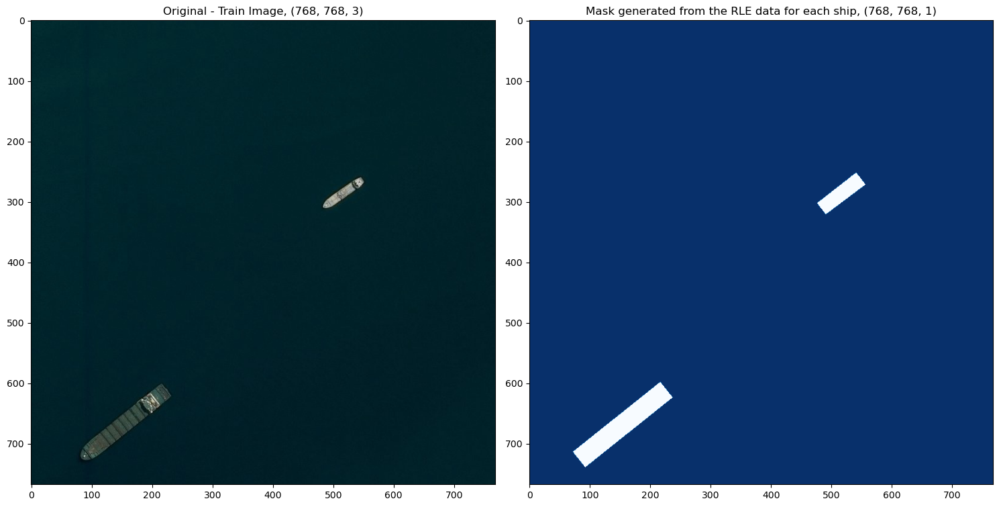

In [22]:
# Copy Paste the code from the prev cell with one change - Transpose!
img=img.reshape(768, 768).T        #Transpose the first ship mask
img1 =img1.reshape(768, 768).T     #Transpose the second ship mask
final= img+img1                    # Generate the final mask with two ships
final = np.expand_dims(final, -1)
plt.figure(figsize=(15, 8))
plt.subplot(1, 2, 1)
plt.title(f"Original - Train Image, {original.shape}")
plt.imshow(original)
plt.subplot(1, 2, 2)
plt.title(f"Mask generated from the RLE data for each ship, {final.shape}")
plt.imshow(final, cmap = "Blues_r")
plt.tight_layout()
plt.show()


In [23]:
#Define functions to do these tasks for all the training images
def rle_decode(mask_rle, shape=(768,768)):
    '''
    Input arguments:-
    mask_rle: Mask of one ship in the train image
    shape: Output shape of the image array
    '''
    s=mask_rle.split()                                                                   #Split the mask of each ship that is in RLE format
    starts, lengths = [np.asarray(x, dtype=int) for x in (s[0:][::2], s[1:][::2])]               #Get the start pixels and lengths for which image has ship
    ends = starts + lengths-1                                                            #Get the end pixels where we need to stop
    img = np.zeros(shape[0]*shape[1], dtype=np.uint8)                                    #A 1D vec full of zeros of size = 768*768
    for lo, hi in zip(starts, ends):                                                     #For each start to end pixels where ship exists
        img[lo:hi+1]=1                                                                   # Fill those values with 1 in the main 1D vector
    '''
    Returns -
    Transposed array of the mask: Contains 1s and 0s. 1 for ship and 0 for background
    '''
    return img.reshape(shape).T

def masks_as_image(in_mask_list):
    '''
    Input
    in_mask_list: List of the masks of each ship in one whole training image
    '''
    all_masks = np.zeros((768, 768), dtype = np.int16)                                    # Creating 0s for the background
    for mask in in_mask_list:                                                             #For each ship rle data in the list of mask rle
        if isinstance(mask, str):                                                         #If the datatype is string
            all_masks += rle_decode(mask)                                                 # Use rle_decode to create one mask for whole image
    '''
    Returns -
    Full mask of the training image whose RLE data has been passed as an input
    '''
    return np.expand_dims(all_masks, -1)

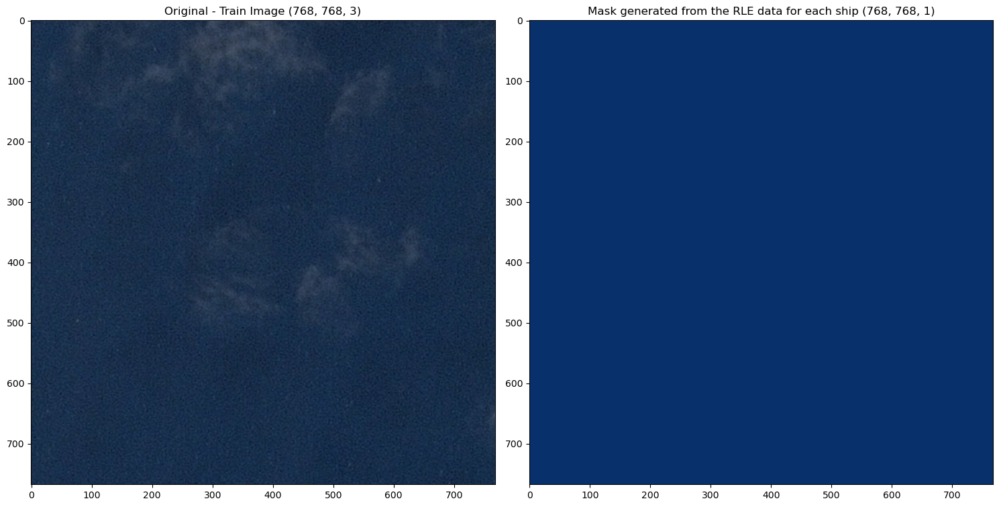

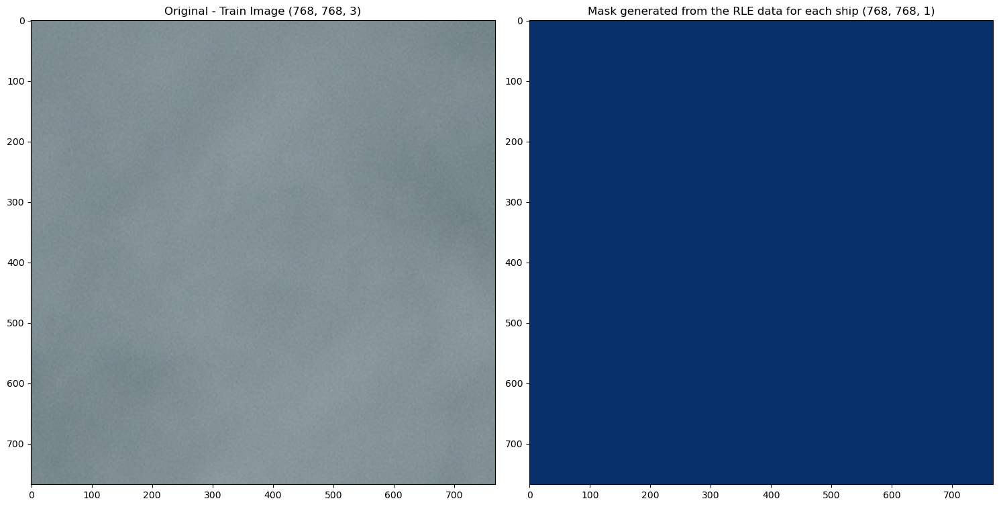

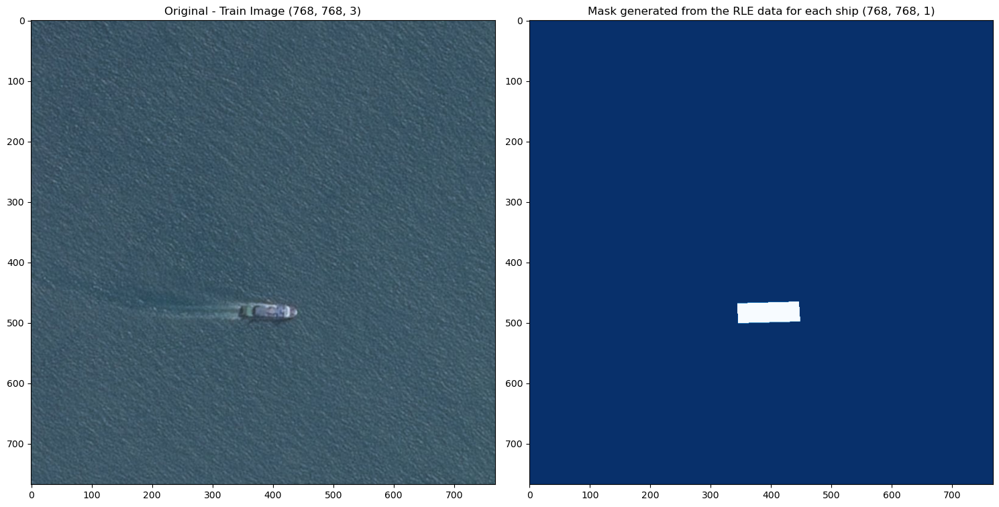

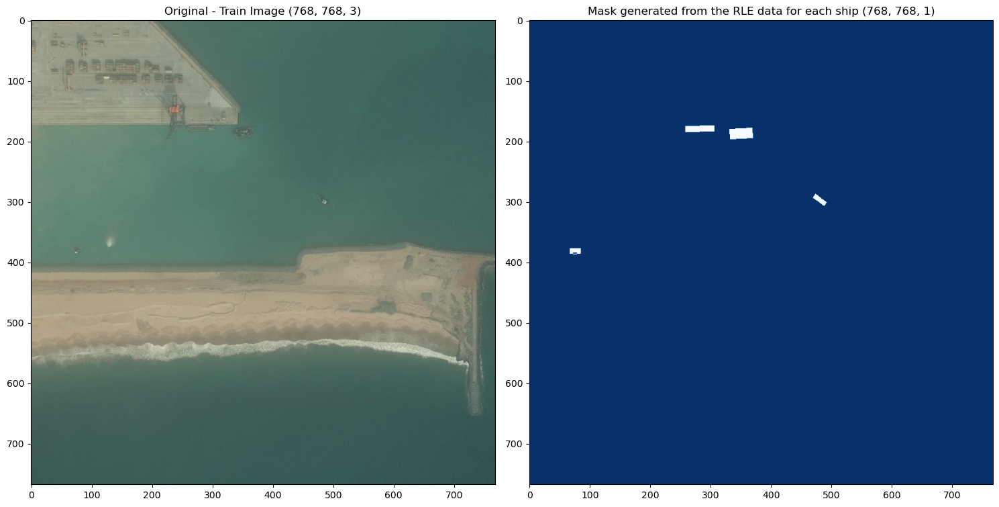

In [24]:
for num in [1, 2, 3, 4]:
    rle_0 = masks.query(f'ImageId=="{train_images[num-1]}"')['EncodedPixels']
    img_0 = masks_as_image(rle_0)
    original = imread(train_image_dir+"/"+train_images[num-1])
    plt.figure(figsize=(15, 8))
    plt.subplot(1, 2, 1)
    plt.title(f"Original - Train Image {original.shape}")
    plt.imshow(original)
    plt.subplot(1, 2, 2)
    plt.title(f"Mask generated from the RLE data for each ship {final.shape}")
    plt.imshow(img_0, cmap = "Blues_r")
    plt.tight_layout()
    plt.show()

In [25]:
'''Note that NaN values in the EncodedPixels are of float type and everything else is a string type'''
#Add пеw feature to the masks data frame named as ship.
#If Encoded pixel in anу row is a string. there is a ship else there isn't.
masks['ships']=masks["EncodedPixels"].map(lambda c_row: 1 if isinstance(c_row,str) else 0)
masks.head(9)

,ImageId,EncodedPixels,ships
0,00003e153.jpg,NaN,0
1,0001124c7.jpg,NaN,0
2,000155de5.jpg,264661 17 265429 33 266197 33 266965 33 267733...,1
3,000194a2d.jpg,360486 1 361252 4 362019 5 362785 8 363552 10 ...,1
4,000194a2d.jpg,51834 9 52602 9 53370 9 54138 9 54906 9 55674 ...,1
5,000194a2d.jpg,198320 10 199088 10 199856 10 200624 10 201392...,1
6,000194a2d.jpg,55683 1 56451 1 57219 1 57987 1 58755 1 59523 ...,1
7,000194a2d.jpg,254389 9 255157 17 255925 17 256693 17 257461 ...,1
8,0001b1832.jpg,NaN,0


In [26]:
#Making a new data frame with unique image ids where we are summing up the ship counts
unique_img_ids =masks.groupby("ImageId").agg({'ships': 'sum'}).reset_index()
unique_img_ids.index+=1 # Incrimenting all the index by 1
unique_img_ids.head()

,ImageId,ships
1,00003e153.jpg,0
2,0001124c7.jpg,0
3,000155de5.jpg,1
4,000194a2d.jpg,5
5,0001b1832.jpg,0


In [27]:
#Adding a new feature to unique_img_ids data frame. If ship exists in image, val is 1 else 0.
unique_img_ids['has_ship'] = unique_img_ids['ships'].map(lambda x: 1.0 if x>0 else 0.0)
unique_img_ids.head()

,ImageId,ships,has_ship
1,00003e153.jpg,0,0.0
2,0001124c7.jpg,0,0.0
3,000155de5.jpg,1,1.0
4,000194a2d.jpg,5,1.0
5,0001b1832.jpg,0,0.0


In [28]:
#Check the size of the files. Will take some time to run as there are loads of files!!!
unique_img_ids['file_size_kb']=unique_img_ids['ImageId'].map(lambda c_img_id: os.stat(os.path.join(train_image_dir,c_img_id)).st_size/1024)
'''os.stat is used to get status of the specified path. Here, st_size represents size of the file in bytes. Converting it into kB!''' 

'os.stat is used to get status of the specified path. Here, st_size represents size of the file in bytes. Converting it into kB!'

In [29]:
#We can get rid of any images whose size is less than 35 Kb. As some of the files are corrupted!
unique_img_ids[unique_img_ids.file_size_kb<35].head()

,ImageId,ships,has_ship,file_size_kb
85,001bfb70a.jpg,0,0.0,22.796875
359,0080bd6a5.jpg,0,0.0,14.327148
819,011589d1f.jpg,0,0.0,20.317383
1434,01df54887.jpg,0,0.0,16.492188
2342,0318fc519.jpg,0,0.0,13.289062


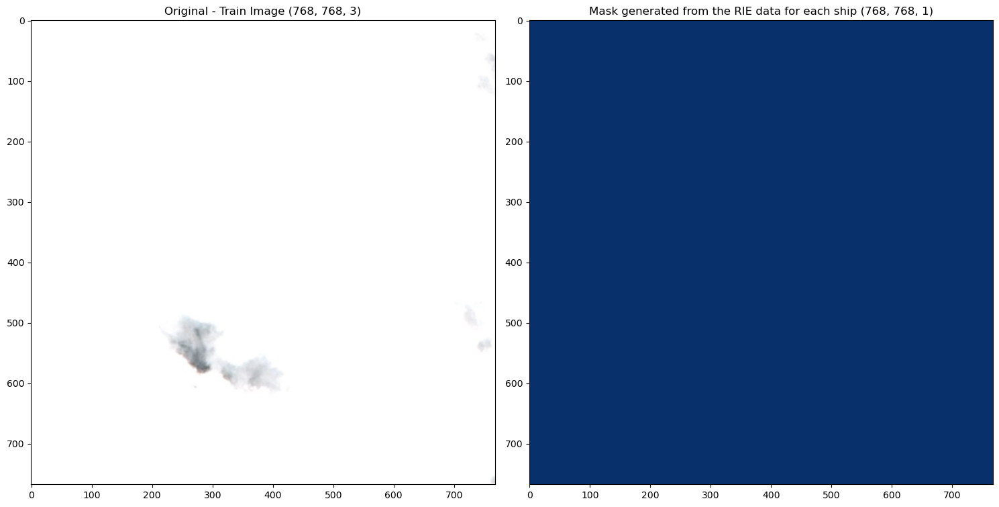

In [30]:
rle_0= masks.query(f'ImageId=="0318fc519.jpg"')['EncodedPixels']
img_0= masks_as_image(rle_0)
original=imread(train_image_dir+"/"+'0318fc519.jpg')
plt.figure(figsize=(15, 8))
plt.subplot(1, 2, 1)
plt.title(f'Original - Train Image {original.shape}')
plt.imshow(original)
plt.subplot(1, 2, 2)
plt.title(f'Mask generated from the RlE data for each ship {final.shape}')
plt.imshow(img_0,cmap="Blues_r")
plt.tight_layout()
plt.show()

In [31]:
#Keep the files whose size > 35 kb
unique_img_ids=unique_img_ids[unique_img_ids.file_size_kb > 35]
unique_img_ids.head()

,ImageId,ships,has_ship,file_size_kb
1,00003e153.jpg,0,0.0,128.944336
2,0001124c7.jpg,0,0.0,76.059570
3,000155de5.jpg,1,1.0,147.625977
4,000194a2d.jpg,5,1.0,75.221680
5,0001b1832.jpg,0,0.0,95.627930


In [32]:
# Also, retrive the old masks data frame
masks.drop(["ships"], axis=1, inplace=True)
masks.index+=1
masks.head()

,ImageId,EncodedPixels
1,00003e153.jpg,NaN
2,0001124c7.jpg,NaN
3,000155de5.jpg,264661 17 265429 33 266197 33 266965 33 267733...
4,000194a2d.jpg,360486 1 361252 4 362019 5 362785 8 363552 10 ...
5,000194a2d.jpg,51834 9 52602 9 53370 9 54138 9 54906 9 55674 ...


In [33]:
#Train - Test split
from sklearn.model_selection import train_test_split
train_ids, valid_ids =train_test_split(unique_img_ids, test_size=0.3, stratify=unique_img_ids['ships'])

In [34]:
# Create train data frame
train_df = pd.merge(masks, train_ids)

#Create test data frame
valid_df = pd.merge(masks, valid_ids)                                                     

In [35]:
print("There are ~")
print(train_df.shape[0], "training masks.")
print(valid_df.shape[0], "validation masks.")  

There are ~
162047 training masks.
69439 validation masks.


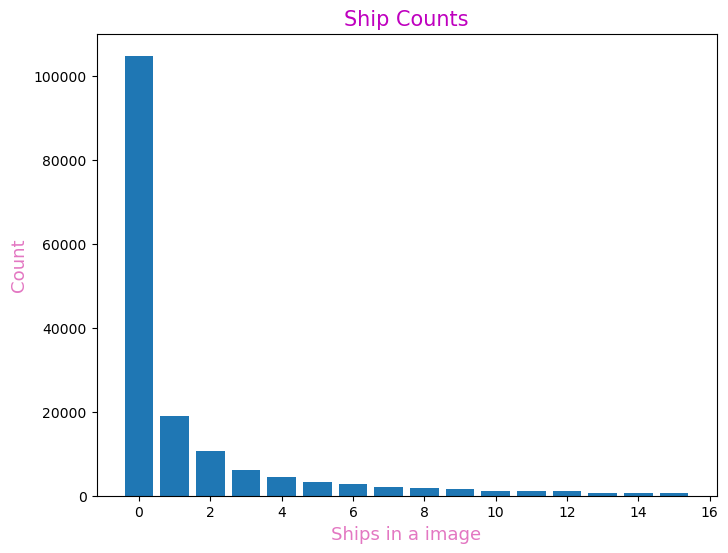

In [36]:
#Visualise the ship counts
plt.figure(figsize=(8,6))
ship_count=train_df['ships'].value_counts()
plt.bar(ship_count.index,ship_count.values)
plt.title("Ship Counts",color='m',fontsize=15)
plt.xlabel("Ships in a image",color='tab:pink',fontsize=13)
plt.ylabel("Count",color='tab:pink',fontsize=13)
plt.show()

In [37]:
#Clipping the max value of grouped_ship_count to be 7, mininum to be 6
train_df['grouped_ship_count']=train_df.ships.map(lambda x: (x+1)//2).clip(0,7)

In [38]:
#Check
train_df.grouped_ship_count.value_counts()

0    104837
1     29713
2     10744
3      5995
4      3772
5      2710
6      2155
7      2121
Name: grouped_ship_count, dtype: int64

In [39]:
#Top 10 data
train_df.head(10)

,ImageId,EncodedPixels,ships,has_ship,file_size_kb,grouped_ship_count
0,0001124c7.jpg,NaN,0,0.0,76.059570,0
1,000194a2d.jpg,360486 1 361252 4 362019 5 362785 8 363552 10 ...,5,1.0,75.221680,3
2,000194a2d.jpg,51834 9 52602 9 53370 9 54138 9 54906 9 55674 ...,5,1.0,75.221680,3
3,000194a2d.jpg,198320 10 199088 10 199856 10 200624 10 201392...,5,1.0,75.221680,3
4,000194a2d.jpg,55683 1 56451 1 57219 1 57987 1 58755 1 59523 ...,5,1.0,75.221680,3
5,000194a2d.jpg,254389 9 255157 17 255925 17 256693 17 257461 ...,5,1.0,75.221680,3
6,0001b1832.jpg,NaN,0,0.0,95.627930,0
7,00021ddc3.jpg,108287 1 109054 3 109821 4 110588 5 111356 5 1...,9,1.0,242.910156,5
8,00021ddc3.jpg,101361 1 102128 3 102896 4 103663 6 104430 9 1...,9,1.0,242.910156,5
9,00021ddc3.jpg,74441 3 75207 5 75975 5 76743 5 77511 5 78280 ...,9,1.0,242.910156,5


In [40]:
#Random 10 data
train_df.sample(10)

,ImageId,EncodedPixels,ships,has_ship,file_size_kb,grouped_ship_count
51982,523734f9c.jpg,73913 7 74681 7 75449 7 76217 7 76985 7 77753 ...,3,1.0,125.512695,2
134886,d59b6ae4d.jpg,96139 1 96906 4 97674 5 98441 5 99209 5 99976 ...,2,1.0,64.490234,1
152345,f0d71767c.jpg,NaN,0,0.0,136.008789,0
94598,9540a73fa.jpg,435245 3 436013 8 436781 14 437548 20 438316 2...,5,1.0,97.141602,3
53253,542fe9ad6.jpg,NaN,0,0.0,120.764648,0
5933,09370552b.jpg,NaN,0,0.0,185.788086,0
33573,351eb4d01.jpg,NaN,0,0.0,146.248047,0
32681,339d3a2a8.jpg,NaN,0,0.0,152.637695,0
70850,6fc81ad9a.jpg,133141 3 133909 8 134677 13 135444 17 136212 1...,2,1.0,113.993164,1
86540,8899e472d.jpg,NaN,0,0.0,108.155273,0


In [41]:
#Random Under-Sampling ships
def sample_ships(in_df, base_rep_val=2000):
    '''
    Input Args:
    in_df - dataframe we want to apply this function
    base_val - random sample of this value to be taken from the data frame
    '''
    if in_df['ships'].values[0]==0:
        return in_df.sample(base_rep_val//3)   #Random 2000//3 = 666 samples taken whose ship count is 0 in an image
    else:
        return in_df.sample(base_rep_val)      #Random 2000 samples taken whose ship count is not 0 in an image

In [42]:
# Creating groups of ship counts and applying the sample_ships functions to randomly undersampie the ships
balanced_train_df = train_df.groupby('grouped_ship_count').apply(sample_ships)
balanced_train_df.grouped_ship_count.value_counts()# In each group we have total of 1500 ships 
#except 0 as we have decreased it even more to 500

1    2000
2    2000
3    2000
4    2000
5    2000
6    2000
7    2000
0     666
Name: grouped_ship_count, dtype: int64

In [43]:
#Explaining what we just did if still not clear
for i in range(8):
    df_val_counts=balanced_train_df[balanced_train_df.grouped_ship_count==i].ships.value_counts()
    print(f"Data frame for grouped ship count = {i} :\n{df_val_counts}\n Sum of Values: {df_val_counts.values.sum()}\n")

Data frame for grouped ship count = 0 :
0    666
Name: ships, dtype: int64
 Sum of Values: 666

Data frame for grouped ship count = 1 :
1    1263
2     737
Name: ships, dtype: int64
 Sum of Values: 2000

Data frame for grouped ship count = 2 :
3    1116
4     884
Name: ships, dtype: int64
 Sum of Values: 2000

Data frame for grouped ship count = 3 :
5    1090
6     910
Name: ships, dtype: int64
 Sum of Values: 2000

Data frame for grouped ship count = 4 :
7    1048
8     952
Name: ships, dtype: int64
 Sum of Values: 2000

Data frame for grouped ship count = 5 :
9     1142
10     858
Name: ships, dtype: int64
 Sum of Values: 2000

Data frame for grouped ship count = 6 :
11    1033
12     967
Name: ships, dtype: int64
 Sum of Values: 2000

Data frame for grouped ship count = 7 :
14    697
13    657
15    646
Name: ships, dtype: int64
 Sum of Values: 2000



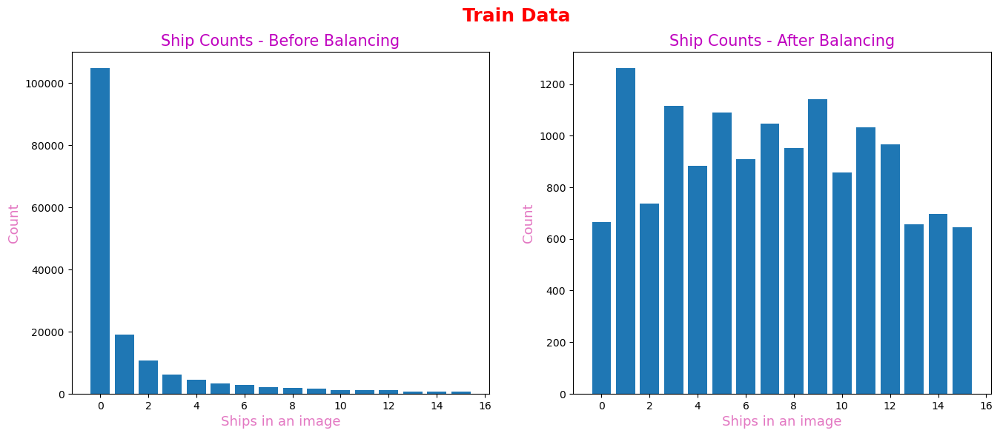

<Figure size 640x480 with 0 Axes>

In [44]:
plt.figure(figsize = (16, 6))
plt.suptitle("Train Data", fontsize = 18, color = 'r' ,weight = 'bold')
plt.subplot(1, 2, 1)
ship_count=train_df['ships'].value_counts()
plt.bar(ship_count.index,ship_count.values)
plt.title("Ship Counts - Before Balancing", color = 'm', fontsize = 15)
plt.ylabel("Count", color = 'tab:pink', fontsize = 13)
plt.xlabel("Ships in an image", color='tab:pink', fontsize = 13)
plt.subplot(1, 2, 2)
balanced_ship_count=balanced_train_df['ships'].value_counts()
plt.bar(balanced_ship_count.index,balanced_ship_count.values)
plt.title("Ship Counts - After Balancing", color='m', fontsize = 15)
plt.ylabel("Count",color='tab:pink',fontsize=13)
plt.xlabel("Ships in an image",color='tab:pink', fontsize = 13)
plt.show()
plt.tight_layout()


In [45]:
import os
import random
import shutil

source_folder = 'C:\\Users\\hp\\Desktop\\airbus-ship-detection\\train_v2'  # Replace with the path to your source folder
destination_folder = 'C:\\Users\\hp\\Desktop\\MINI-PROJECT\\dataset\\test\\images\\images'  # Replace with the path to your destination folder

train_img=os.listdir('C:\\Users\\hp\\Desktop\\MINI-PROJECT\\dataset\\train\\images\\images')
valid_img=os.listdir('C:\\Users\\hp\\Desktop\\MINI-PROJECT\\dataset\\valid\\images\\images')
# Get the list of all image files in the source folder
image_files =[file for file in os.listdir(source_folder) if file.endswith(('.jpg', '.jpeg', '.png'))]

# Randomly select 100 images from the list
random_images = random.sample(image_files, 100)

# Copy the selected images to the destination folder
for image in random_images:
    source_path = os.path.join(source_folder, image)
    destination_path = os.path.join(destination_folder, image)

    # Check if the image is not in the train or valid folder
    if image not in (valid_img or train_img):
        shutil.copy2(source_path, destination_folder)

test_img=os.listdir(destination_folder)
print(f'there is {len(test_img)} in the test folder')

there is 391 in the test folder


In [46]:

masks_test_save_dir='C:\\Users\\hp\\Desktop\\MINI-PROJECT\\dataset\\test\\masks\\masks\\'

for i in test_img:
    rle_0 = masks.query(f'ImageId=="{i}"')['EncodedPixels']
    if not rle_0.empty:
        img_0 = masks_as_image(rle_0)

        # Convert mask image to binary (0s and 1s)
        img_0 = (img_0 > 0).astype(np.uint8)

        # Save the image as a file
        img_path = f"{masks_test_save_dir}{i}"
        if i not in masks_test_save_dir:
            img_0 = img_0 * 255
            img_0 = np.squeeze(img_0)
            img_0 = img_0.astype(np.uint8)
            img_0 = Image.fromarray(img_0)
            img_0.save(img_path)

test_masks_img=os.listdir(masks_test_save_dir)
print(f'there is {len(test_masks_img)} masks in the test folder')

there is 391 masks in the test folder


In [47]:
import os
from PIL import Image
import numpy as np
from skimage.io import imread
from skimage.measure import label

# Train and Test directories
train_image_dir_save = "C:\\Users\\hp\\Desktop\\MINI-PROJECT\\dataset\\train\\images\\images\\"
train_masks_dir_save = "C:\\Users\\hp\\Desktop\\MINI-PROJECT\\dataset\\train\\masks\\masks\\"
"""
# Get image and mask filenames
image_dir = os.listdir(train_image_dir_save)
mask_dir = os.listdir(train_masks_dir_save)

'''save the train images'''
train_img = list(balanced_train_df['ImageId'].unique())
for i in train_img:
    if i not in image_dir:
        img = imread(train_image_dir + '\\' + i)
        img = np.squeeze(img)
        img = img.astype(np.uint8)
        img = Image.fromarray(img)
        img.save(train_image_dir_save + i)
        image_dir.append(i)  # Add the image to the saved image list

print('The number of images saved in train\\images\\images is: ' + str(len(image_dir)))
print('The number of images in train_img is: ' + str(len(train_img)))

'''generate the masks for the train images and save them'''
missing_masks = []
for i in train_img:
    if i not in mask_dir:
        rle_0 = masks.query(f'ImageId=="{i}"')['EncodedPixels']
        if not rle_0.empty:
            img_0 = masks_as_image(rle_0)

            # Convert mask image to binary (0s and 1s)
            img_0 = (img_0 > 0).astype(np.uint8)

            # Save the image as a file
            img_path = f"{train_masks_dir_save}{i}"
            if i not in mask_dir:
                img_0 = img_0 * 255
                img_0 = np.squeeze(img_0)
                img_0 = img_0.astype(np.uint8)
                img_0 = Image.fromarray(img_0)
                img_0.save(img_path)
                mask_dir.append(i)  # Add the mask to the saved mask list
        else:
            missing_masks.append(i)

print('The number of masks saved in train\\masks\\masks is: ' + str(len(mask_dir)))

# Check if all images have been converted to masks
if set(image_dir) == set(mask_dir):
    print('All images in train\\images have been converted to masks')
else:
    print('Some images in train\\images have not been converted to masks')

# Check if all images have their masks calculated
if len(missing_masks) == 0:
    print('All images in train\\images have their masks calculated')
else:
    print('Some images in train\\images do not have their masks calculated')
    print('Images missing masks:', missing_masks)
"""

'\n# Get image and mask filenames\nimage_dir = os.listdir(train_image_dir_save)\nmask_dir = os.listdir(train_masks_dir_save)\n\n\'\'\'save the train images\'\'\'\ntrain_img = list(balanced_train_df[\'ImageId\'].unique())\nfor i in train_img:\n    if i not in image_dir:\n        img = imread(train_image_dir + \'\\\' + i)\n        img = np.squeeze(img)\n        img = img.astype(np.uint8)\n        img = Image.fromarray(img)\n        img.save(train_image_dir_save + i)\n        image_dir.append(i)  # Add the image to the saved image list\n\nprint(\'The number of images saved in train\\images\\images is: \' + str(len(image_dir)))\nprint(\'The number of images in train_img is: \' + str(len(train_img)))\n\n\'\'\'generate the masks for the train images and save them\'\'\'\nmissing_masks = []\nfor i in train_img:\n    if i not in mask_dir:\n        rle_0 = masks.query(f\'ImageId=="{i}"\')[\'EncodedPixels\']\n        if not rle_0.empty:\n            img_0 = masks_as_image(rle_0)\n\n            # 

In [48]:
import pickle
import numpy as np
import pandas as pd
from PIL import Image
import albumentations as A
from IPython.display import SVG
import matplotlib.pyplot as plt
%matplotlib inline
import os, re, sys, random, shutil, cv2

# import segmentation_models as sm
from sklearn.model_selection import train_test_split

import tensorflow as tf
from tensorflow import keras
from keras import backend as K
from keras.models import Model
from keras.optimizers import Adam, Nadam
from keras import applications, optimizers
from keras.applications import InceptionResNetV2
from keras.applications import resnet

from keras.layers import UpSampling2D

from keras.preprocessing.image import ImageDataGenerator
from keras.utils import load_img, img_to_array, to_categorical
from keras.callbacks import ModelCheckpoint, ReduceLROnPlateau, EarlyStopping, CSVLogger, LearningRateScheduler
from keras.layers import Input, Conv2D, BatchNormalization, Activation, MaxPooling2D, Conv2DTranspose, concatenate, ZeroPadding2D, Dropout

In [49]:
image_names = list(os.listdir(train_image_dir_save))

rs = np.random.RandomState(42)

rs.shuffle(image_names)

mask_names = os.listdir(train_masks_dir_save)

print(len(image_names))
print(len(mask_names))

2212
2213


In [50]:
print("Train size :", round(6365 * 0.8), "~ 85%")
print("Validation size :", round(6365 * 0.2), "~ 15%")
#print("Test size :", round(6365 * 0.15), "~ 15%")

Train size : 5092 ~ 85%
Validation size : 1273 ~ 15%


In [51]:
import random

#Train and Test directories
images_dir="C:\\Users\\hp\\Desktop\\MINI-PROJECT\\dataset\\train\\images\\images\\"
masks_dir ="C:\\Users\\hp\\Desktop\\MINI-PROJECT\\dataset\\train\\masks\\masks\\"
'''
# Shuffle the list
random.shuffle(image_names)

# Calculate the split index
split_index = int(len(image_names) * 0.2)

valid_data=image_names[:split_index]

for i, name in enumerate(valid_data):
    shutil.move(images_dir + name, "C:\\Users\\hp\\Desktop\\MINI-PROJECT\\dataset\\valid\\images\\images\\" + name)
    shutil.move(masks_dir + name, "C:\\Users\\hp\\Desktop\\MINI-PROJECT\\dataset\\valid\\masks\\masks\\" + name)
'''

'\n# Shuffle the list\nrandom.shuffle(image_names)\n\n# Calculate the split index\nsplit_index = int(len(image_names) * 0.2)\n\nvalid_data=image_names[:split_index]\n\nfor i, name in enumerate(valid_data):\n    shutil.move(images_dir + name, "C:\\Users\\hp\\Desktop\\MINI-PROJECT\\dataset\\valid\\images\\images\\" + name)\n    shutil.move(masks_dir + name, "C:\\Users\\hp\\Desktop\\MINI-PROJECT\\dataset\\valid\\masks\\masks\\" + name)\n'

In [52]:
len(valid_data)

NameError: name 'valid_data' is not defined

In [53]:
train_dir = 'C:\\Users\\hp\\Desktop\\MINI-PROJECT\\dataset\\train'
valid_dir = 'C:\\Users\\hp\\Desktop\\MINI-PROJECT\\dataset\\train'
test_dir = 'C:\\Users\\hp\\Desktop\\MINI-PROJECT\\dataset\\test'

In [54]:
def mask_to_onehot(mask):
    mask_segment = np.zeros(mask.shape, dtype=np.int8)
    mask_segment[mask == 0] = 0
    mask_segment[mask != 0] = 1
    mask_segment = mask_segment[:,:,0]
    mask_segment = to_categorical(mask_segment, num_classes=2)
    return mask_segment

def onehot_to_mask(onehot):
    single_layer = np.argmax(onehot, axis=-1)
    output = np.zeros( onehot.shape[:2]+(3,) )
    output[single_layer == 0] = (0, 0, 0)
    output[single_layer == 1] = (128, 128, 128)
    return np.uint8(output)

def flatten_mask(mask):
    mask[mask == 0] = 0
    mask[mask != 0] = 128
    return mask

In [55]:

train_images_datagen = ImageDataGenerator(dtype='float32', rescale= 1./255.)
train_masks_datagen = ImageDataGenerator()

valid_images_datagen = ImageDataGenerator(dtype='float32', rescale= 1./255.)
valid_masks_datagen = ImageDataGenerator()

test_images_datagen = ImageDataGenerator(dtype='float32', rescale= 1./255.)
test_masks_datagen = ImageDataGenerator()

In [56]:

def TrainGenerator(train_images_dir, train_masks_dir, seed = 42, batch_size = 32, target_size = (512, 512)):

    train_image_generator = train_images_datagen.flow_from_directory(
    train_images_dir,
    batch_size = batch_size, 
    seed = seed, 
    target_size = target_size)

    train_mask_generator = train_masks_datagen.flow_from_directory(
    train_masks_dir,
    batch_size = batch_size, 
    seed = seed, 
    target_size = target_size)

    while True:
        X1i = train_image_generator.next()
        X2i = train_mask_generator.next()
        
        #One hot encoding masks
        mask_encoded = [mask_to_onehot(X2i[0][x,:,:,:]) for x in range(X2i[0].shape[0])]
        
        yield X1i[0], np.asarray(mask_encoded)

def ValidGenerator(valid_images_dir, valid_masks_dir, seed = 42, batch_size = 32, target_size = (512, 512)):

    valid_image_generator = valid_images_datagen.flow_from_directory(
    valid_images_dir,
    batch_size = batch_size, 
    seed = seed, 
    target_size = target_size)


    valid_mask_generator = valid_masks_datagen.flow_from_directory(
    valid_masks_dir,
    batch_size = batch_size, 
    seed = seed, 
    target_size = target_size)


    while True:
        X1i = valid_image_generator.next()
        X2i = valid_mask_generator.next()
        
        #One hot encoding masks
        mask_encoded = [mask_to_onehot(X2i[0][x,:,:,:]) for x in range(X2i[0].shape[0])]
        
        yield X1i[0], np.asarray(mask_encoded)

def TestGenerator(test_images_dir, test_masks_dir, seed = 42, batch_size = 32, target_size = (512, 512)):

    test_image_generator = test_images_datagen.flow_from_directory(
    test_images_dir,
    batch_size = batch_size, 
    seed = seed, 
    target_size = target_size)


    test_mask_generator = test_masks_datagen.flow_from_directory(
    test_masks_dir,
    batch_size = batch_size, 
    seed = seed, 
    target_size = target_size)


    while True:
        X1i = test_image_generator.next()
        X2i = test_mask_generator.next()
        
        #One hot encoding masks
        mask_encoded = [mask_to_onehot(X2i[0][x,:,:,:]) for x in range(X2i[0].shape[0])]
        
        yield X1i[0], np.asarray(mask_encoded)

In [57]:

def multi_segnet_model(n_classes=2, image_height=512, image_width=512, image_channels=3):

    inputs = Input((image_height, image_width, image_channels))

    source_input = inputs

    c1 = Conv2D(16, (3,3), padding="same")(source_input)
    c1 = BatchNormalization()(c1)
    c1 = Activation('relu')(c1)
    c1 = Conv2D(16, (3,3), padding="same")(c1)
    c1 = BatchNormalization()(c1)
    c1 = Activation('relu')(c1)
    p1 = MaxPooling2D((2,2))(c1)
    
    c2 = Conv2D(32, (3,3), padding="same")(p1)
    c2 = BatchNormalization()(c2)
    c2 = Activation('relu')(c2)
    c2 = Conv2D(32, (3,3), padding="same")(c2)
    c2 = BatchNormalization()(c2)
    c2 = Activation('relu')(c2)
    p2 = MaxPooling2D((2,2))(c2)
    
    c3 = Conv2D(64, (3,3), padding="same")(p2)
    c3 = BatchNormalization()(c3)
    c3 = Activation('relu')(c3)
    c3 = Conv2D(64, (3,3), padding="same")(c3)
    c3 = BatchNormalization()(c3)
    c3 = Activation('relu')(c3)
    c3 = Conv2D(64, (3,3), padding="same")(c3)
    c3 = BatchNormalization()(c3)
    c3 = Activation('relu')(c3)
    p3 = MaxPooling2D((2,2))(c3)
    
    c4 = Conv2D(128, (3,3), padding="same")(p3)
    c4 = BatchNormalization()(c4)
    c4 = Activation('relu')(c4)
    c4 = Conv2D(128, (3,3), padding="same")(c4)
    c4 = BatchNormalization()(c4)
    c4 = Activation('relu')(c4)
    c4 = Conv2D(128, (3,3), padding="same")(c4)
    c4 = BatchNormalization()(c4)
    c4 = Activation('relu')(c4)
    p4 = MaxPooling2D((2,2))(c4)
    
    c5 = Conv2D(256, (3,3), padding="same")(p4)
    c5 = BatchNormalization()(c5)
    c5 = Activation('relu')(c5)
    c5 = Conv2D(256, (3,3), padding="same")(c5)
    c5 = BatchNormalization()(c5)
    c5 = Activation('relu')(c5)
    c5 = Conv2D(256, (3,3), padding="same")(c5)
    c5 = BatchNormalization()(c5)
    c5 = Activation('relu')(c5)
    p5 = MaxPooling2D((2,2))(c5)
    
    
    
    u6 = UpSampling2D((2,2))(p5)
    c6 = Conv2D(256, (3,3), padding="same")(u6)
    c6 = BatchNormalization()(c6)
    c6 = Activation('relu')(c6)
    c6 = Conv2D(256, (3,3), padding="same")(c6)
    c6 = BatchNormalization()(c6)
    c6 = Activation('relu')(c6)
    c6 = Conv2D(256, (3,3), padding="same")(c6)
    c6 = BatchNormalization()(c6)
    c6 = Activation('relu')(c6)
    
    u7 = UpSampling2D((2,2))(c6)
    c7 = Conv2D(128, (3,3), padding="same")(u7)
    c7 = BatchNormalization()(c7)
    c7 = Activation('relu')(c7)
    c7 = Conv2D(128, (3,3), padding="same")(c7)
    c7 = BatchNormalization()(c7)
    c7 = Activation('relu')(c7)
    c7 = Conv2D(128, (3,3), padding="same")(c7)
    c7 = BatchNormalization()(c7)
    c7 = Activation('relu')(c7)
    
    u8 = UpSampling2D((2,2))(c7)
    c8 = Conv2D(64, (3,3), padding="same")(u8)
    c8 = BatchNormalization()(c8)
    c8 = Activation('relu')(c8)
    c8 = Conv2D(64, (3,3), padding="same")(c8)
    c8 = BatchNormalization()(c8)
    c8 = Activation('relu')(c8)
    c8 = Conv2D(64, (3,3), padding="same")(c8)
    c8 = BatchNormalization()(c8)
    c8 = Activation('relu')(c8)
    
    u9 = UpSampling2D((2,2))(c8)
    c9 = Conv2D(32, (3,3), padding="same")(u9)
    c9 = BatchNormalization()(c9)
    c9 = Activation('relu')(c9)
    c9 = Conv2D(32, (3,3), padding="same")(c9)
    c9 = BatchNormalization()(c9)
    c9 = Activation('relu')(c9)
    
    u10 = UpSampling2D((2,2))(c9)
    c10 = Conv2D(16, (3,3), padding="same")(u10)
    c10 = BatchNormalization()(c10)
    c10 = Activation('relu')(c10)
    c10 = Conv2D(16, (3,3), padding="same")(c10)
    c10 = BatchNormalization()(c10)
    c10 = Activation('relu')(c10)
    
    outputs = Conv2D(n_classes, (1,1), padding="valid")(c10)
    outputs = Activation('softmax')(outputs)

    model = Model(inputs=[inputs], outputs=[outputs])
    
    return model

In [58]:

segnet_model = multi_segnet_model()

In [59]:

def exponential_decay(lr0, s):
    def exponential_decay_fn(epoch):
        return lr0 * 0.1 **(epoch / s)
    return exponential_decay_fn

exponential_decay_fn = exponential_decay(0.0001, 60)

lr_scheduler = LearningRateScheduler(
    exponential_decay_fn,
    verbose=1
)

checkpoint = ModelCheckpoint(
    filepath = 'Ship_detection_model.h5',
    save_best_only = True,
    monitor = 'val_loss',
    mode = 'auto', 
    verbose = 1
)

earlystop = EarlyStopping(
    monitor = 'val_loss', 
    min_delta = 0.001, 
    patience = 10,
    mode = 'auto', 
    verbose = 1,
    restore_best_weights = True
)

csvlogger = CSVLogger(
    filename= "model_training.csv",
    separator = ",",
    append = False
)

callbacks = [checkpoint, earlystop, csvlogger, lr_scheduler]


def iou_coef(y_true, y_pred):
    y_true_flatten = K.flatten(y_true)
    y_pred_flatten = K.flatten(y_pred)
    intersection = K.sum(y_true_flatten * y_pred_flatten)
    final_coef_value = (intersection + 1.0) / (K.sum(y_true_flatten) + K.sum(y_pred_flatten) - intersection + 1.0)
    return final_coef_value

In [60]:

# 1. Check target mask shape
target_masks = TrainGenerator(train_images_dir=os.path.join(train_dir, "images"), train_masks_dir=os.path.join(train_dir, "masks"))
for images, masks in target_masks:
    print('Target mask shape:', masks.shape)
    break

# 2. Check number of classes in the model
num_classes = 2  # Replace with the actual number of classes in your dataset
print('Number of classes in the model:', num_classes)

# 3. Verify label encoding for target masks
target_masks = TrainGenerator(train_images_dir=os.path.join(train_dir, "images"), train_masks_dir=os.path.join(train_dir, "masks"))
for images, masks in target_masks:
    unique_labels = np.unique(masks)
    print('Unique labels in target masks:', unique_labels)
    break

# 4. Verify image-mask pairing
target_masks = TrainGenerator(train_images_dir=os.path.join(train_dir, "images"), train_masks_dir=os.path.join(train_dir, "masks"))
for images, masks in target_masks:
    num_images = len(images)
    num_masks = len(masks)
    print('Number of images:', num_images)
    print('Number of masks:', num_masks)
    break


Found 2212 images belonging to 1 classes.
Found 2213 images belonging to 1 classes.
Target mask shape: (32, 512, 512, 2)
Number of classes in the model: 2
Found 2212 images belonging to 1 classes.
Found 2213 images belonging to 1 classes.
Unique labels in target masks: [0. 1.]
Found 2212 images belonging to 1 classes.
Found 2213 images belonging to 1 classes.
Number of images: 32
Number of masks: 32


In [58]:
K.clear_session()

segnet_model.compile(optimizer=Adam(learning_rate = 0.0001), loss='categorical_crossentropy', metrics=["accuracy", iou_coef])

segnet_history = segnet_model.fit(
    TrainGenerator(train_images_dir = os.path.join(train_dir, "images"), train_masks_dir = os.path.join(train_dir, "masks")), 
    batch_size=32,
    steps_per_epoch=29,
    validation_data = ValidGenerator(valid_images_dir = os.path.join(valid_dir, "images"), valid_masks_dir = os.path.join(valid_dir, "masks")), 
    validation_steps = 6,
    epochs = 100,
    callbacks=callbacks,
    verbose=1,
    shuffle=False
)

Found 4067 images belonging to 1 classes.
Found 4067 images belonging to 1 classes.

Epoch 1: LearningRateScheduler setting learning rate to 0.0001.
Epoch 1/100
29/29 [==============================] - ETA: 0s - loss: 0.7615 - accuracy: 0.5866 - iou_coef: 0.3316  Found 4067 images belonging to 1 classes.
Found 4067 images belonging to 1 classes.

Epoch 1: val_loss improved from inf to 0.69310, saving model to Ship_detection_model.h5
29/29 [==============================] - 2332s 79s/step - loss: 0.7615 - accuracy: 0.5866 - iou_coef: 0.3316 - val_loss: 0.6931 - val_accuracy: 0.8289 - val_iou_coef: 0.3334 - lr: 1.0000e-04

Epoch 2: LearningRateScheduler setting learning rate to 9.623506263980886e-05.
Epoch 2/100
29/29 [==============================] - ETA: 0s - loss: 0.5024 - accuracy: 0.9726 - iou_coef: 0.4520  
Epoch 2: val_loss improved from 0.69310 to 0.67331, saving model to Ship_detection_model.h5
29/29 [==============================] - 2602s 90s/step - loss: 0.5024 - accuracy: 0


Epoch 18: LearningRateScheduler setting learning rate to 5.2079483285954645e-05.
Epoch 18/100
29/29 [==============================] - ETA: 0s - loss: 0.2236 - accuracy: 0.9916 - iou_coef: 0.6760  
Epoch 18: val_loss improved from 0.24257 to 0.23820, saving model to Ship_detection_model.h5
29/29 [==============================] - 1963s 67s/step - loss: 0.2236 - accuracy: 0.9916 - iou_coef: 0.6760 - val_loss: 0.2382 - val_accuracy: 0.9915 - val_iou_coef: 0.6561 - lr: 5.2079e-05

Epoch 19: LearningRateScheduler setting learning rate to 5.011872336272724e-05.
Epoch 19/100
29/29 [==============================] - ETA: 0s - loss: 0.2192 - accuracy: 0.9920 - iou_coef: 0.6822  
Epoch 19: val_loss improved from 0.23820 to 0.22539, saving model to Ship_detection_model.h5
29/29 [==============================] - 2050s 69s/step - loss: 0.2192 - accuracy: 0.9920 - iou_coef: 0.6822 - val_loss: 0.2254 - val_accuracy: 0.9935 - val_iou_coef: 0.6698 - lr: 5.0119e-05

Epoch 20: LearningRateScheduler se

29/29 [==============================] - 2566s 86s/step - loss: 0.1788 - accuracy: 0.9916 - iou_coef: 0.7282 - val_loss: 0.1781 - val_accuracy: 0.9918 - val_iou_coef: 0.7293 - lr: 2.7123e-05

Epoch 36: LearningRateScheduler setting learning rate to 2.6101572156825366e-05.
Epoch 36/100
29/29 [==============================] - ETA: 0s - loss: 0.1767 - accuracy: 0.9918 - iou_coef: 0.7301  
Epoch 36: val_loss improved from 0.17808 to 0.17607, saving model to Ship_detection_model.h5
29/29 [==============================] - 2482s 81s/step - loss: 0.1767 - accuracy: 0.9918 - iou_coef: 0.7301 - val_loss: 0.1761 - val_accuracy: 0.9918 - val_iou_coef: 0.7315 - lr: 2.6102e-05

Epoch 37: LearningRateScheduler setting learning rate to 2.51188643150958e-05.
Epoch 37/100
29/29 [==============================] - ETA: 0s - loss: 0.1760 - accuracy: 0.9914 - iou_coef: 0.7321  
Epoch 37: val_loss improved from 0.17607 to 0.17359, saving model to Ship_detection_model.h5
29/29 [=============================

Epoch 53/100
29/29 [==============================] - ETA: 0s - loss: 0.1601 - accuracy: 0.9916 - iou_coef: 0.7520  
Epoch 53: val_loss improved from 0.15926 to 0.15740, saving model to Ship_detection_model.h5
29/29 [==============================] - 2043s 70s/step - loss: 0.1601 - accuracy: 0.9916 - iou_coef: 0.7520 - val_loss: 0.1574 - val_accuracy: 0.9924 - val_iou_coef: 0.7555 - lr: 1.3594e-05

Epoch 54: LearningRateScheduler setting learning rate to 1.3081774742601943e-05.
Epoch 54/100
29/29 [==============================] - ETA: 0s - loss: 0.1586 - accuracy: 0.9922 - iou_coef: 0.7542  
Epoch 54: val_loss improved from 0.15740 to 0.15728, saving model to Ship_detection_model.h5
29/29 [==============================] - 2100s 72s/step - loss: 0.1586 - accuracy: 0.9922 - iou_coef: 0.7542 - val_loss: 0.1573 - val_accuracy: 0.9920 - val_iou_coef: 0.7562 - lr: 1.3082e-05

Epoch 55: LearningRateScheduler setting learning rate to 1.2589254117941673e-05.
Epoch 55/100
29/29 [==============


Epoch 71: LearningRateScheduler setting learning rate to 6.812920690579612e-06.
Epoch 71/100
29/29 [==============================] - ETA: 0s - loss: 0.1505 - accuracy: 0.9920 - iou_coef: 0.7652  
Epoch 71: val_loss did not improve from 0.14750
29/29 [==============================] - 2364s 78s/step - loss: 0.1505 - accuracy: 0.9920 - iou_coef: 0.7652 - val_loss: 0.1506 - val_accuracy: 0.9913 - val_iou_coef: 0.7680 - lr: 6.8129e-06

Epoch 72: LearningRateScheduler setting learning rate to 6.556418494179789e-06.
Epoch 72/100
29/29 [==============================] - ETA: 0s - loss: 0.1500 - accuracy: 0.9920 - iou_coef: 0.7658  
Epoch 72: val_loss did not improve from 0.14750
29/29 [==============================] - 2586s 87s/step - loss: 0.1500 - accuracy: 0.9920 - iou_coef: 0.7658 - val_loss: 0.1490 - val_accuracy: 0.9919 - val_iou_coef: 0.7675 - lr: 6.5564e-06

Epoch 73: LearningRateScheduler setting learning rate to 6.309573444801933e-06.
Epoch 73/100
29/29 [=========================

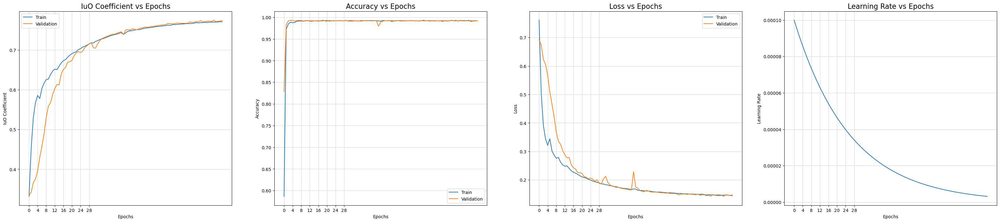

In [60]:
fig, ax = plt.subplots(1, 4, figsize=(40, 8))
ax = ax.ravel()
metrics = ['IuO Coefficient', 'Accuracy', 'Loss', 'Learning Rate']

for i, met in enumerate(['iou_coef', 'accuracy', 'loss', 'lr']): 
    if met != 'lr':
        ax[i].plot(segnet_history.history[met])
        ax[i].plot(segnet_history.history['val_' + met])
        ax[i].set_title('{} vs Epochs'.format(metrics[i]), fontsize=16)
        ax[i].set_xlabel('Epochs')
        ax[i].set_ylabel(metrics[i])
        ax[i].set_xticks(np.arange(0,32,4))
        ax[i].legend(['Train', 'Validation'])
        ax[i].xaxis.grid(True, color = "lightgray", linewidth = "0.8", linestyle = "-")
        ax[i].yaxis.grid(True, color = "lightgray", linewidth = "0.8", linestyle = "-")
    else:
        ax[i].plot(segnet_history.history[met])
        ax[i].set_title('{} vs Epochs'.format(metrics[i]), fontsize=16)
        ax[i].set_xlabel('Epochs')
        ax[i].set_ylabel(metrics[i])
        ax[i].set_xticks(np.arange(0,32,4))
        ax[i].xaxis.grid(True, color = "lightgray", linewidth = "0.8", linestyle = "-")
        ax[i].yaxis.grid(True, color = "lightgray", linewidth = "0.8", linestyle = "-")

In [61]:
from keras.models import load_model
from tensorflow.keras.utils import get_custom_objects

#hna addir dik l fonction dice_p_bce()
def iou_coef(y_true, y_pred):
    y_true_flatten = K.flatten(y_true)
    y_pred_flatten = K.flatten(y_pred)
    intersection = K.sum(y_true_flatten * y_pred_flatten)
    final_coef_value = (intersection + 1.0) / (K.sum(y_true_flatten) + K.sum(y_pred_flatten) - intersection + 1.0)
    return final_coef_value

get_custom_objects()['iou_coef'] = iou_coef
#load our saved model
segnet_model=load_model("C:\\Users\\hp\\Desktop\\MINI-PROJECT\\code\\Ship_detection_model.h5")

In [62]:

testing_gen = TestGenerator(test_images_dir = os.path.join(test_dir, "images"),
                            test_masks_dir = os.path.join(test_dir, "masks"),
                            batch_size = 16)

segnet_model.evaluate(testing_gen,
                      batch_size = 16,
                      steps = 12)

Found 391 images belonging to 1 classes.
Found 391 images belonging to 1 classes.
12/12 [==============================] - 52s 4s/step - loss: 0.1285 - accuracy: 0.9991 - iou_coef: 0.7861


[0.12847433984279633, 0.999129056930542, 0.7861060500144958]

1/1 [==============================] - 4s 4s/step


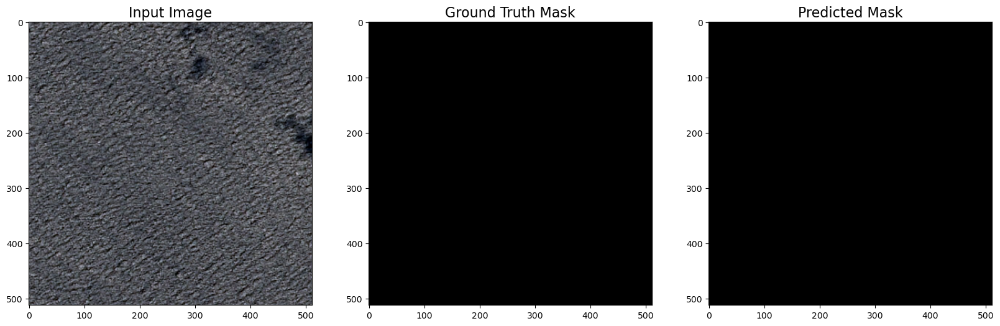

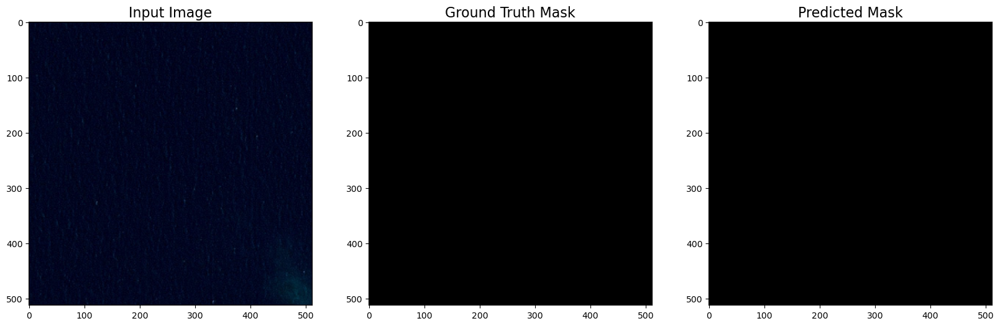

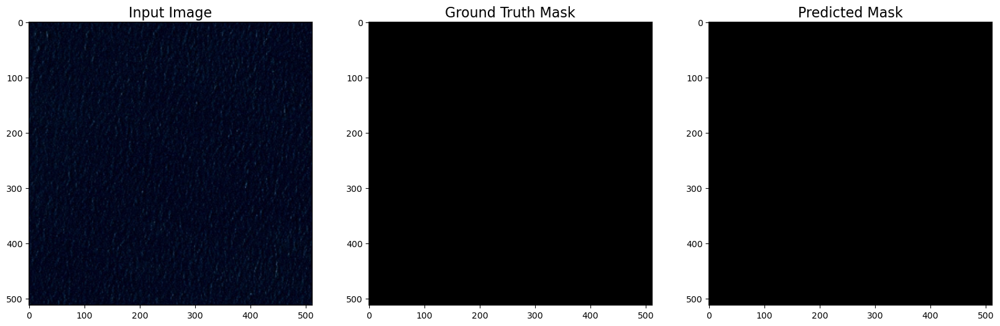

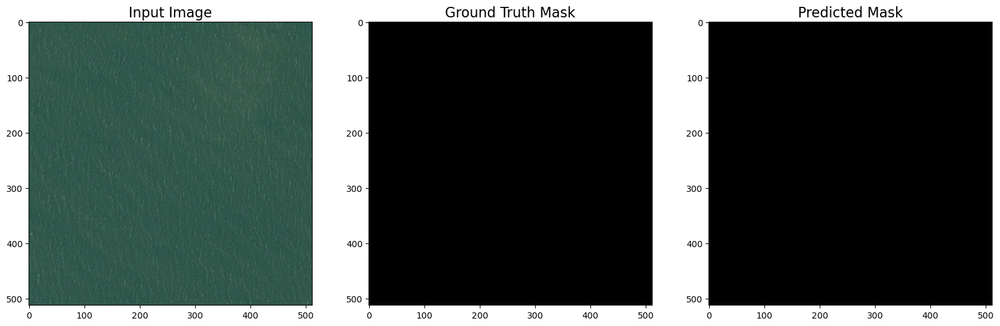

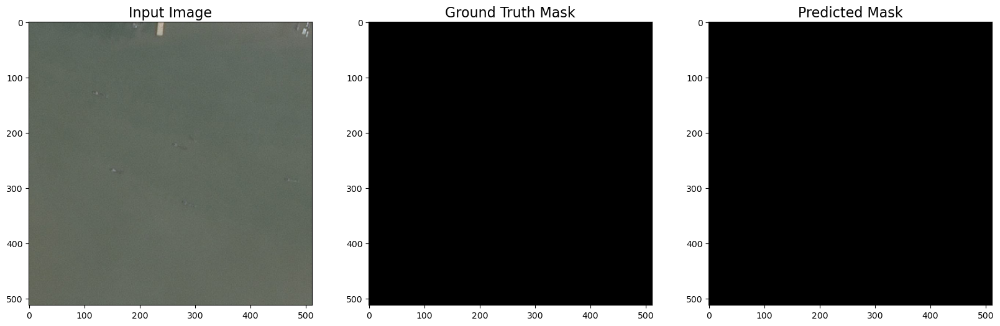

...

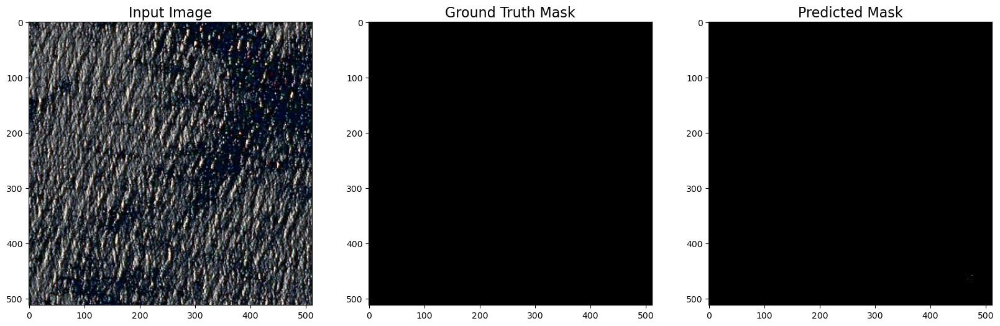

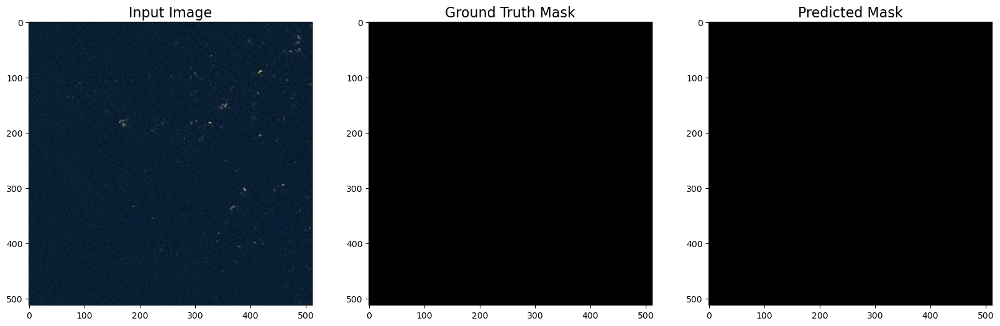

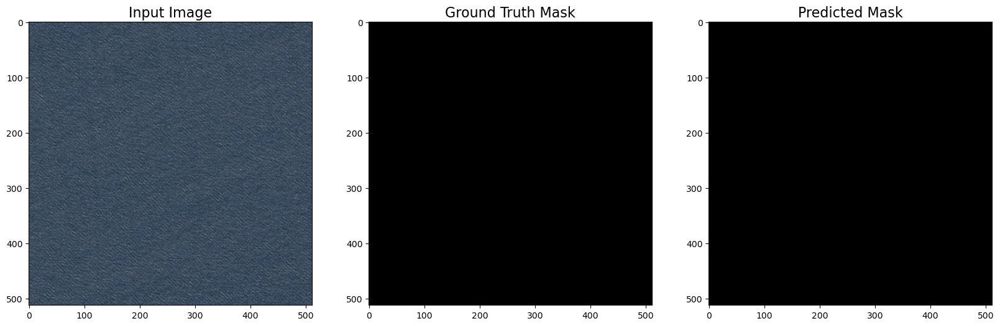

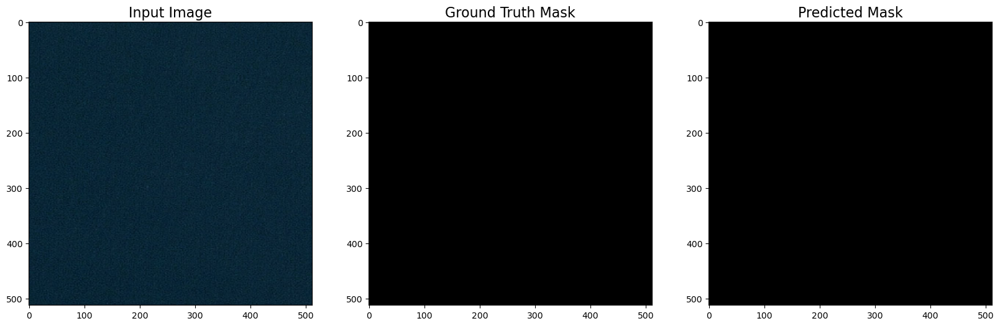

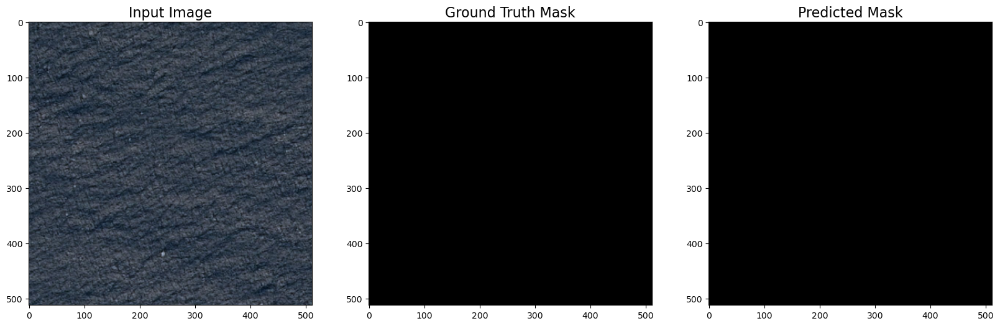

In [63]:
batch_img,batch_mask = next(testing_gen)
pred_all = segnet_model.predict(batch_img)
np.shape(pred_all)

for j in range(0,np.shape(pred_all)[0]):
    fig = plt.figure(figsize=(20,8))

    ax1 = fig.add_subplot(1,3,1)
    ax1.imshow(batch_img[j])
    ax1.set_title('Input Image', fontdict={'fontsize': 16, 'fontweight': 'medium'})
    ax1.grid(False)

    ax2 = fig.add_subplot(1,3,2)
    ax2.set_title('Ground Truth Mask', fontdict={'fontsize': 16, 'fontweight': 'medium'})
    ax2.imshow(onehot_to_mask(batch_mask[j]))
    ax2.grid(False)

    ax3 = fig.add_subplot(1,3,3)
    ax3.set_title('Predicted Mask', fontdict={'fontsize': 16, 'fontweight': 'medium'})
    ax3.imshow(onehot_to_mask(pred_all[j]))
    ax3.grid(False)

    plt.show()

1/1 [==============================] - 0s 292ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


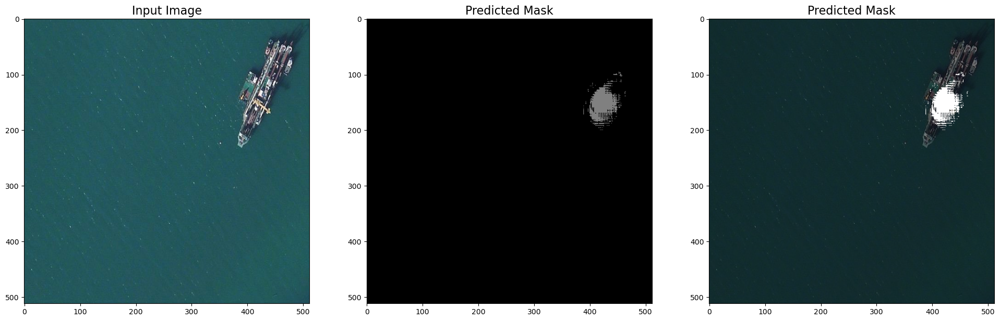

In [64]:
tmp_img = img_to_array(load_img("C:\\Users\\hp\\Desktop\MINI-PROJECT\\code\\test_image.png", target_size = (512,512)))
tmp_img = tf.expand_dims(tmp_img, 0) / 255.0

prediction = segnet_model.predict(tmp_img)
tmp_mask = onehot_to_mask(prediction[0])

fig = plt.figure(figsize=(24,8))

ax1 = fig.add_subplot(1,3,1)
ax1.imshow(tmp_img[0])
ax1.set_title('Input Image', fontdict={'fontsize': 16, 'fontweight': 'medium'})
ax1.grid(False)

ax2 = fig.add_subplot(1,3,2)
ax2.set_title('Predicted Mask', fontdict={'fontsize': 16, 'fontweight': 'medium'})
ax2.imshow(tmp_mask)
ax2.grid(False)

dst = cv2.addWeighted(np.array(tmp_img[0]), 0.5, tmp_mask, 0.5, 0, dtype = cv2.CV_32F)
ax3 = fig.add_subplot(1,3,3)
ax3.set_title('Predicted Mask', fontdict={'fontsize': 16, 'fontweight': 'medium'})
ax3.imshow(dst)
ax3.grid(False)

1/1 [==============================] - 0s 306ms/step


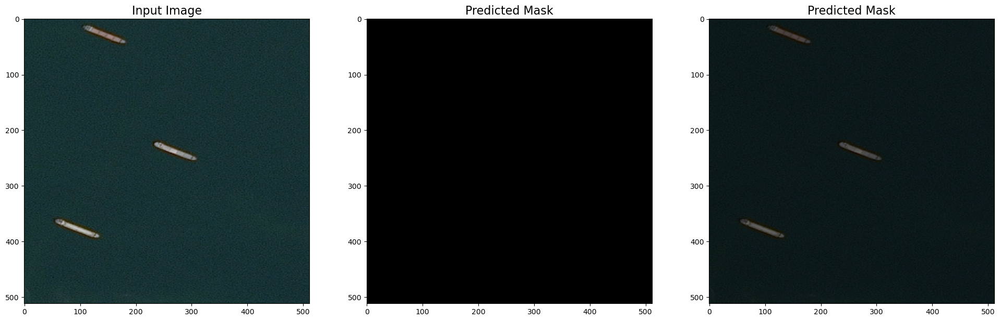

In [68]:
tmp_img = img_to_array(load_img("C:\\Users\\hp\\Desktop\MINI-PROJECT\\code\\test_image2.jpg", target_size = (512,512)))
tmp_img = tf.expand_dims(tmp_img, 0) / 255.0

prediction = segnet_model.predict(tmp_img)
tmp_mask = onehot_to_mask(prediction[0])

fig = plt.figure(figsize=(24,8))

ax1 = fig.add_subplot(1,3,1)
ax1.imshow(tmp_img[0])
ax1.set_title('Input Image', fontdict={'fontsize': 16, 'fontweight': 'medium'})
ax1.grid(False)

ax2 = fig.add_subplot(1,3,2)
ax2.set_title('Predicted Mask', fontdict={'fontsize': 16, 'fontweight': 'medium'})
ax2.imshow(tmp_mask) 
ax2.grid(False)

dst = cv2.addWeighted(np.array(tmp_img[0]), 0.5, tmp_mask, 0.5, 0, dtype = cv2.CV_32F)
ax3 = fig.add_subplot(1,3,3)
ax3.set_title('Predicted Mask', fontdict={'fontsize': 16, 'fontweight': 'medium'})
ax3.imshow(dst)
ax3.grid(False)